# MACHINE LEARNING MODEL FOR THE ANALYSIS OF DIABETES IN FEMALES

In [3]:
!pip install pandas_profiling

In [6]:
# IMPORTING OF LIBRARIES

import numpy as np # linear algebra

import pandas as pd # data processing

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set()

from pandas_profiling import ProfileReport

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# IMPORTING OF DATASET

diabetes_data = pd.read_csv('diabetes.csv')

##  **TABLE OF CONTENT**
<p style="color:blue;">
    <b>
 1. BASIC EDA AND STATISTICAL ANALYSIS<br> 
 2. TEST TRAIN SPLIT<br>
 3. ALGORITHM<br>
 4. HYPER PARAMETER OPTIMISATION<br>
 5. PREDICT YOUR DISEASE<br>
    </b>
</p>

# **BASIC EDA AND STATISTICAL ANALYSIS**

<p style="color:purple;">
    <b>
1. PANDAS PROFILING<br>
2. GETTING INFORMTION OF THE DATASET<br>
3. STATISTICAL ANALYSIS<br>
4. COUNT DIABETES AND NON-DIABETES<br>
5. PAIR PLOT<br>
6. HEAT MAP AND CORRELATION
    </b>
</p>

<p style="color:red;">
    <b>
PANDAS PROFILING
    </b>
</p>


In [7]:
ProfileReport(diabetes_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<p style="color:red;">
    <b>
 GETTING INFORMTION OF THE DATASET
    </b>
</p>

In [8]:
diabetes_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


<p style="color:red;">
    <b>
 STATISTICAL ANALYSIS
    </b>
</p>

In [9]:
diabetes_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


<p style="color:red;">
    <b>
COUNT DIABETES AND NON-DIABETES
    </b>
</p>

0    500
1    268
Name: Outcome, dtype: int64


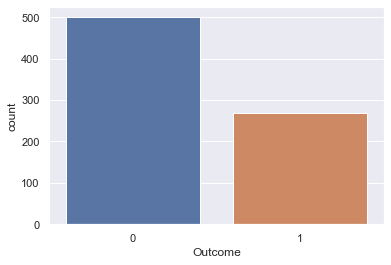

In [10]:
print(diabetes_data.Outcome.value_counts())
sns.countplot(x=diabetes_data.Outcome ,data=diabetes_data)
plt.show()

<p style="color:red;">
    <b>
PAIR PLOT
    </b>
</p>

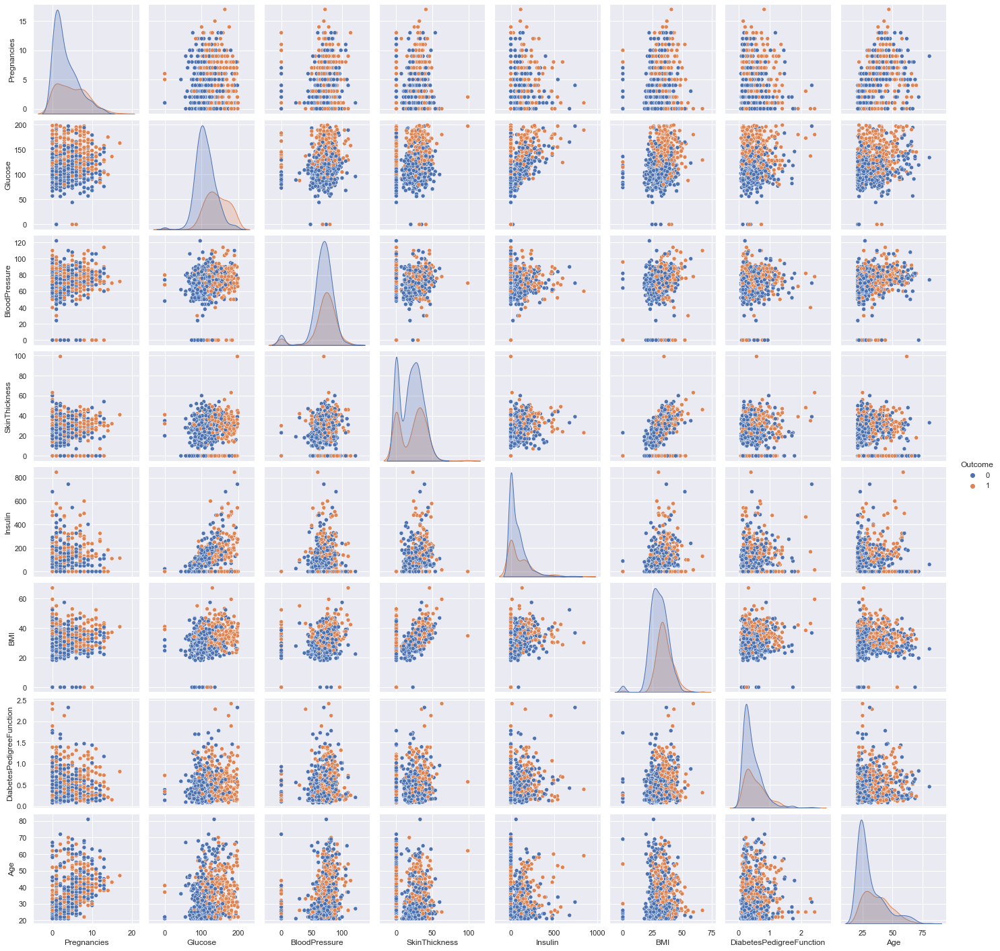

In [11]:
p=sns.pairplot(diabetes_data, hue = 'Outcome')

<p style="color:red;">
    <b>
HEAT MAP AND CORRELATION
    </b>
</p>

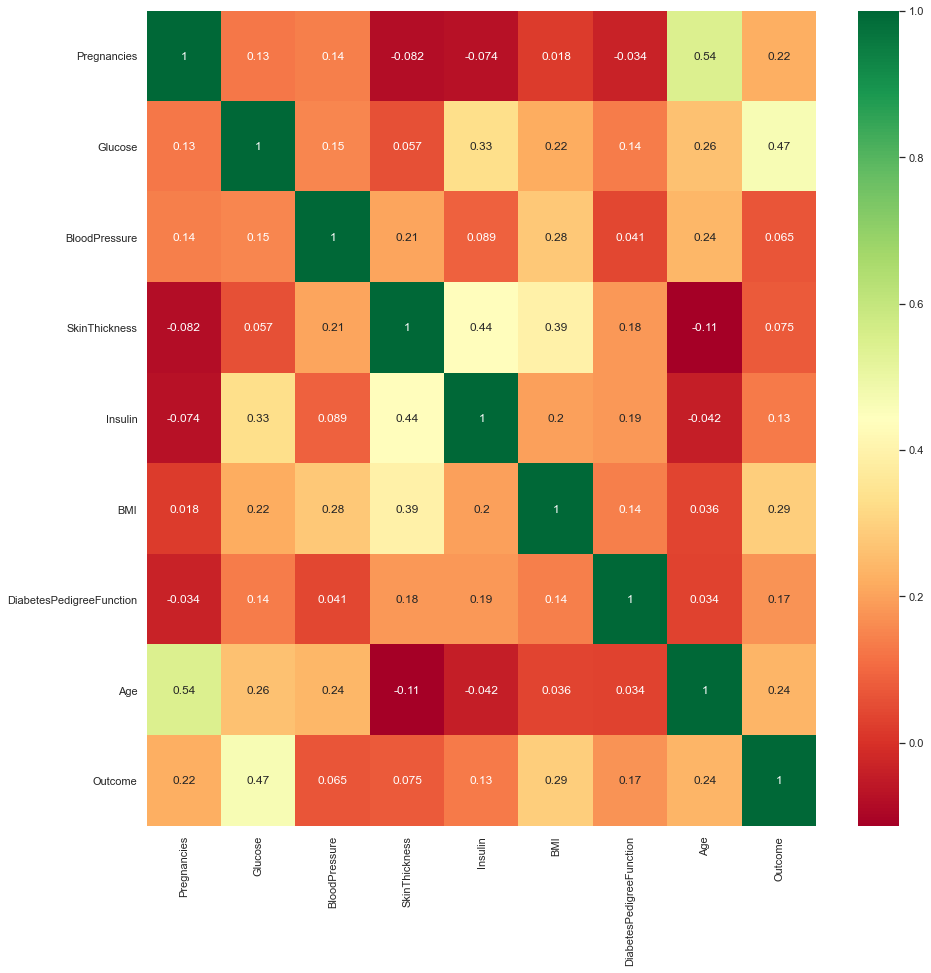

In [12]:
#get correlations of each features in dataset
corrmat = diabetes_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(15,15))
#plot heat map
g=sns.heatmap(diabetes_data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# TEST TRAIN SPLIT 

In [13]:
from sklearn.model_selection import train_test_split
feature_columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
predicted_class = ['Outcome']


In [14]:
X = diabetes_data[feature_columns].values
y = diabetes_data[predicted_class].values


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state=10)

# ALGORITHM

<p style="color:purple;">
    <b>
1. APPLYING OF THE ALGORITHM<br>
2. CHECKING THE ACCURACY
    </b>
</p>

<p style="color:red;">
    <b>
APPLYING OF THE ALGORITHM
    </b>
</p>

In [15]:
## Apply Algorithm

from sklearn.ensemble import RandomForestClassifier
random_forest_model = RandomForestClassifier(random_state=10)

random_forest_model.fit(X_train, y_train.ravel())

RandomForestClassifier(random_state=10)

In [16]:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, #min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

RandomForestClassifier(n_estimators=10, random_state=10)

<p style="color:red;">
    <b>
CHECKING THE ACCURACY
    </b>
</p>

In [17]:

predict_train_data = random_forest_model.predict(X_test)
from sklearn import metrics
print("Accuracy = {0:.3f}".format(metrics.accuracy_score(y_test, predict_train_data)))


Accuracy = 0.749


**ACCURACY = 74% , BEFORE OPTIMISATION**

# HYPER PARAMETER OPTIMISATION

<p style="color:purple;">
    <b>
1. OPTIMISATION USING XGBOOST<br>
2. FINDING OF THE BEST ESTIMATOR<br>
3. USING OF THE BEST ESTIMATOT<br>
4. TRAINING OF THE MODEL ON THE BEST FIT MODEL<br>
5. CROSS-VALIDATION OF THE DATASET<br>
6. PREDICTION OF THE TEST DATA<br>
7. CONFUSION MATRIX AND ACCURACY SCORE<br>
    </b>
</p>

<p style="color:red;">
    <b>
OPTIMISATION USING XGBOOST
    </b>
</p>

In [18]:
## Hyper Parameter Optimization

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
    
}


In [20]:
!pip install xgboost

In [21]:
## Hyperparameter optimization using RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
import xgboost

In [22]:

classifier=xgboost.XGBClassifier()

In [23]:
random_search=RandomizedSearchCV(classifier,param_distributions=params,n_iter=5,scoring='roc_auc',n_jobs=-1,cv=5,verbose=3)

In [24]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))


In [25]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X_train,y_train.ravel())
timer(start_time) # timing ends here for "start_time" variable

Fitting 5 folds for each of 5 candidates, totalling 25 fits

 Time taken: 0 hours 0 minutes and 6.04 seconds.


<p style="color:red;">
    <b>
FINDING OF THE BEST ESTIMATOR
    </b>
</p>

In [26]:
random_search.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.3, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.05, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=6, max_leaves=0, min_child_weight=7, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

<p style="color:red;">
    <b>
USING OF THE BEST ESTIMATOR
    </b>
</p>

In [27]:
classifier=xgboost.XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.3,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.3, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=4, max_leaves=0, min_child_weight=7,
               monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1)

<p style="color:red;">
    <b>
TRAINING THE MODEL ON THE BEST FIT MODEL
    </b>
</p>

In [28]:
classifier.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.3,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.3, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=4, max_leaves=0, min_child_weight=7, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

<p style="color:red;">
    <b>
CROSS-VALIDATION OF THE DATASET
    </b>
</p>

In [29]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(classifier,X_train,y_train.ravel(),cv=10)

score

score.mean()



0.7653039832285116

**ACCURACY = 77%, ON CROSS-VALIDATION DATASET**

<p style="color:red;">
    <b>
PREDICTION OF THE TEST DATA
    </b>
</p>

In [30]:
y_pred=classifier.predict(X_test)


<p style="color:red;">
    <b>
CONFUSION MATRIX AND ACCURACY SCORE<br>
    </b>
</p>

In [31]:
from sklearn.metrics import confusion_matrix,accuracy_score

cm=confusion_matrix(y_test,y_pred)
score= accuracy_score(y_test,y_pred)

print(cm)
print(score)

[[125  19]
 [ 39  48]]
0.7489177489177489


**ACCURACY = 74% AFTER OPTIMISATION**

# PREDICT YOUR DISEASE 

In [32]:
# Put your datas in the format, 
# y_pred_data=classifier.predict([['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']])
# Here we go
y_pred_data=classifier.predict([[1,85,66,29,0,26.6,0.351,31]])
print(y_pred_data)
# If outcome is [1] : Diabetes
# If outcoe is [0] : Non-Diabetes

[0]
